## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---

In [2]:
reset -sf

In [3]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from moviepy.editor import VideoFileClip
%matplotlib inline

In [4]:
from ipywidgets import widgets
from ipywidgets import interact

### Step 1: Calibration & Undistortion Image

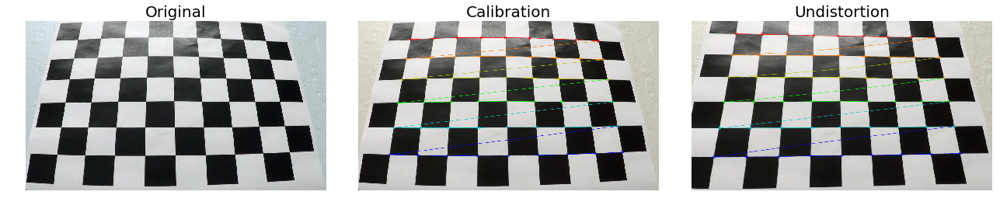

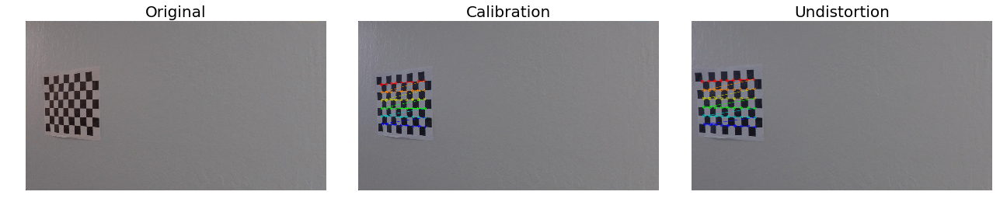

In [36]:
'''
This is the step to make 2D plane images from 3D images in real world space.
In the real world, images are distorted, so making images into 2D place 
by calculating the camera calibration matrix and distortion coefficients.
'''

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for i in np.random.randint(0, len(images)-1, 2):
    img = cv2.imread(images[i])
    y, x = img.shape[:2]
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (9,6), corners, ret)
        
        # Calibrate Images and undistortion with distortion coefficients
        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, (x, y), None, None)
        undist = cv2.undistort(img, mtx, dist, None, mtx)
        
        f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))
        f.tight_layout()
        ax1.axis('off')
        ax1.imshow(cv2.cvtColor(mpimg.imread(images[i]), cv2.COLOR_BGR2RGB))
        ax1.set_title('Original', fontsize=20)
        ax3.axis('off')
        ax3.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
        ax3.set_title('Undistortion', fontsize=20)
        ax2.axis('off')
        ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax2.set_title('Calibration', fontsize=20)

In [125]:
def calibration():
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((6*9,3), np.float32)
    objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.

    # Make a list of calibration images
    images = glob.glob('./camera_cal/calibration*.jpg')

    # Step through the list and search for chessboard corners
    for i in range(len(images)):
        img = cv2.imread(images[i])
        y, x = img.shape[:2]
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)

            # Calibrate Images and undistortion with distortion coefficients
            ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, (x, y), None, None)
    return mtx, dist

In [126]:
mtx, dist = calibration()

In [127]:
mtx, dist

(array([[1.15777818e+03, 0.00000000e+00, 6.67113857e+02],
        [0.00000000e+00, 1.15282217e+03, 3.86124583e+02],
        [0.00000000e+00, 0.00000000e+00, 1.00000000e+00]]),
 array([[-0.24688507, -0.02373156, -0.00109831,  0.00035107, -0.00259866]]))

In [128]:
def undistortion(img, mtx, dist):
    '''
    This function makes undistortion image (2D plane image) from 3D image in real world
    INPUT:
        - img: image matrix or image file in 3D (distorted image)
        - mtx: Camera calibration matrix from chessboard images
        - dist: Distortion Coefficients
        
    OUTPUT:
        - 2D plane image (no distortion)
    '''
    if type(img) == str:
        img = cv2.imread(img)
    elif type(img) == type(np.array([0])):
        img = img
    else:
        print('Check the Image Files...') 
    
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

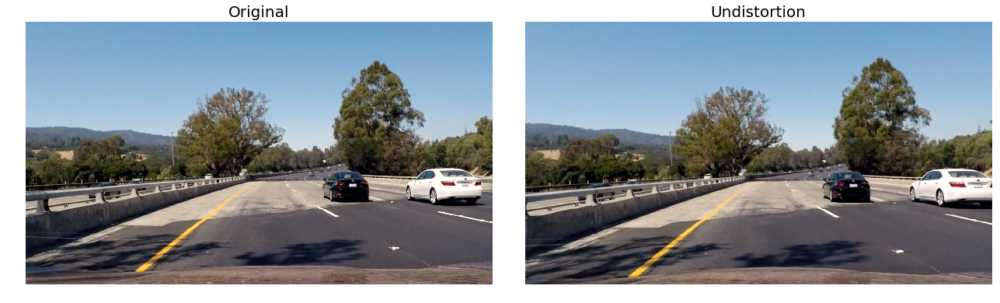

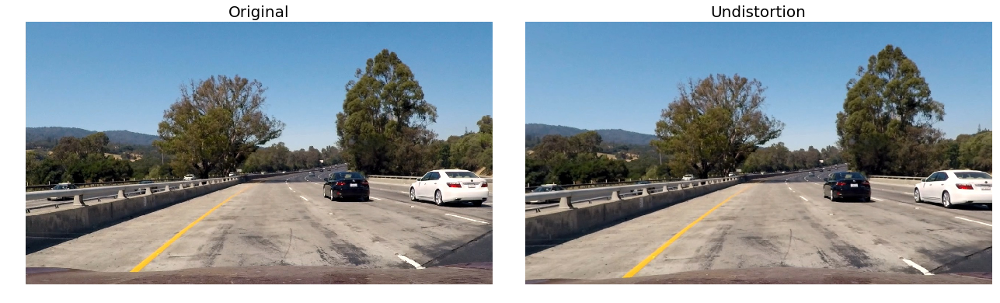

In [129]:
'''
Randomly choose test images, and make undistorted images
original images are  RGB images, so no need to apply cvtColor function
However, after apply cv2.undistort(), it needs to convert as RGB from BGR
'''
images = glob.glob('./test_images/*.jpg')
for i in np.random.randint(0, len(images)-1, 2):
    undist = undistortion(images[i], mtx, dist)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))
    f.tight_layout()
    ax1.axis('off')
    ax1.imshow(mpimg.imread(images[i]))
    ax1.set_title('Original', fontsize=20)
    ax2.axis('off')
    ax2.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
    ax2.set_title('Undistortion', fontsize=20)

### Step 2: Perspective Transform

In [130]:
def tran_perspective(img, mtx, dist):
    '''
    This function makes perspective transformed image (bird eyes) with source points and destination points.
    The perspective changes into bird eyes images from the trapezoid perspective on the original image
      - Source Points: Trapezoid perspective from 4 points on the original images
      - Destination Points: 4 destination points, source points are tranformed into destination points location
      
    INPUT:
        - img: image matrix or image file in 3D (distorted image)
        - mtx: Camera calibration matrix from chessboard images
        - dist: Distortion Coefficients
        
    OUTPUT:
        - bird eyes images
    '''
    
    img = undistortion(img, mtx, dist)
    y, x = img.shape[:2]                       # row, column == y, x

    # Source points
    sp1 = [0, y-10]                      # Left Bottom
    sp2 = [x*.43, y*.64]                 # Left Top
    sp3 = [x*.57, y*.64]                 # Right Top
    sp4 = [x, y-10]                      # Right Bottom
    
    # Destination points
    dp1 = [0, y]                         # Left Bottom
    dp2 = [0, 0]                         # Left Top
    dp3 = [x, 0]                         # Right Top
    dp4 = [x, y]                         # Right Bottom

    img_line = img.copy()
    points = np.array([sp3, sp4, sp1, sp2], np.int32)
    cv2.polylines(img_line, [points], 1, (255, 0, 255), thickness=3)
    
    source = np.float32([sp3, sp4, sp1, sp2])
    destination = np.float32([dp3, dp4, dp1, dp2])
    
    M = cv2.getPerspectiveTransform(source, destination)
    M_inv = cv2.getPerspectiveTransform(destination, source)
    warped = cv2.warpPerspective(img, M, (x, y))
    
    return img_line, warped, M_inv

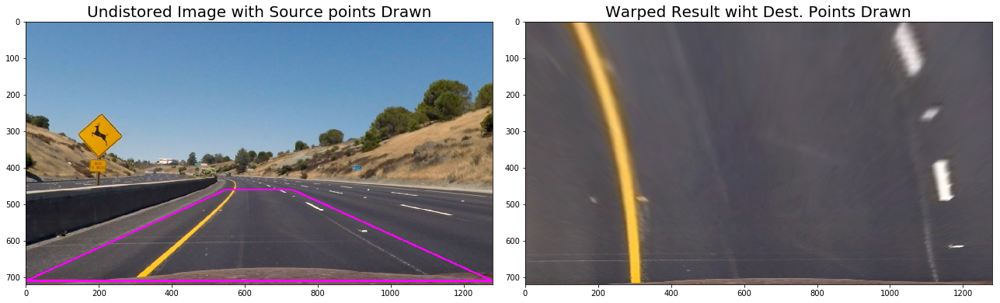

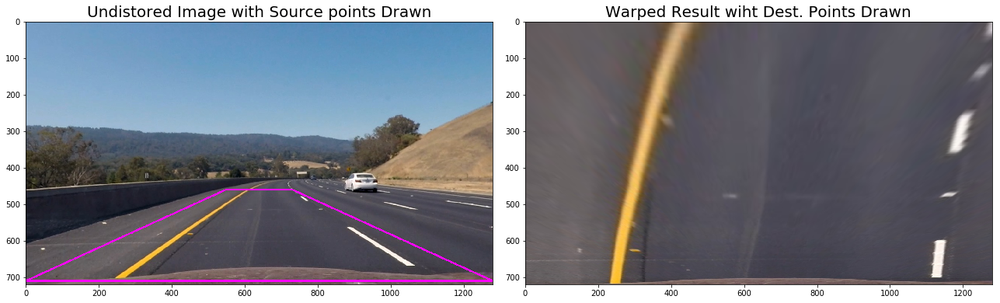

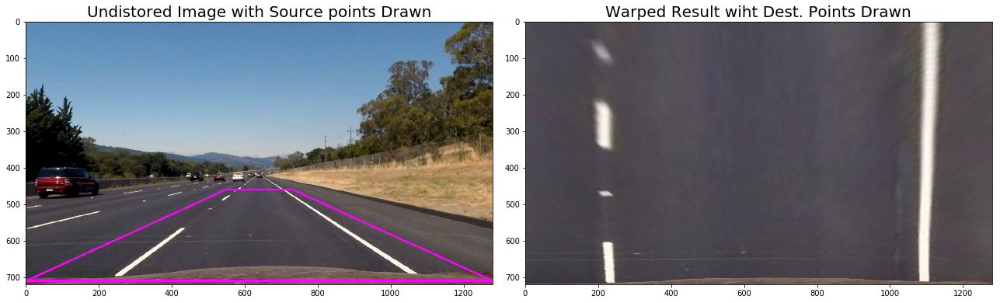

In [139]:
'''
Randomly choose test images, and make undistorted images with changing perspective as bird eyes
'''
images = glob.glob('./test_images/*.jpg')
for i in np.random.randint(0, len(images)-1, 3):
    img_line, warped, _ = tran_perspective(images[i], mtx, dist)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))
    f.tight_layout()
    ax1.imshow(cv2.cvtColor(img_line, cv2.COLOR_BGR2RGB))
    ax1.set_title('Undistored Image with Source points Drawn', fontsize=20)
    ax2.imshow(cv2.cvtColor(warped, cv2.COLOR_BGR2RGB))
    ax2.set_title('Warped Result wiht Dest. Points Drawn', fontsize=20)

In [140]:
def ls_channel_thresh(img, l_thresh, s_thresh):
    '''
    Apply binary Threshold in S-Channel and L-Channel after converted into HLS color space
    S_Thresh: It detects yellow and white lanes
    L_Thresh: It helps to avoid shadowed and darked pixels
    '''
    light = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)[:,:,1]
    sat = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)[:,:,2]
    
    combine_binary = np.zeros_like(sat)

    sat_binary = (sat > s_thresh) & (sat <= 255)
    light_binary = (light > l_thresh) & (light <= 255)
    
    ls_thresh = (light_binary & sat_binary)
    combine_binary[ls_thresh] = 1
    
    return combine_binary, ls_thresh

In [141]:
def sobelx_thresh(img, thresh_min, thresh_max):
    '''
    Apply the gradient(sobel) Threshold on the horizontal gradient.
    Sobel(Gradient) : Apply Horizontal Gradient
    '''
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)             #convert to gray scale
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)              #apply gradient threshold on the horizontal gradient
    
    abs_sobelx = np.abs(sobelx)
    scaled_sobel = np.uint8(255*abs_sobelx / np.max(abs_sobelx))
    sobel_binary = np.zeros_like(scaled_sobel)
    
    sobel_thresh = (scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)
    sobel_binary[sobel_thresh] = 1
    return sobel_binary

In [142]:
def direction_thresh(img, thresh_min, thresh_max):
    '''
    Apply the gradient direction Threshold to find the direction.
    Direction threshold : Apply gradient direction threshold so that only edges closer to vertical are detected.
    '''
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)             #convert to gray scale
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)      #apply gradient threshold on the horizontal gradient
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)      #apply gradient threshold on the vertical gradient

    abs_sobelx = np.abs(sobelx)
    abs_sobely = np.abs(sobely)
        
    #Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient
    direction = np.abs(np.arctan2(abs_sobely, abs_sobelx))
    
    direction_binary = np.zeros_like(direction)
    direction_thresh = (direction >= thresh_min) & (direction <= thresh_max)
    direction_binary[direction_thresh] = 1
    return direction_binary

In [143]:
def plot_img(ori_img, warped, sat_binary, title01='', title03=''):
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 8))
    f.tight_layout()
    ax1.imshow(cv2.cvtColor(ori_img, cv2.COLOR_BGR2RGB))
    ax1.set_title(title01, fontsize=20)
    ax2.imshow(cv2.cvtColor(warped, cv2.COLOR_BGR2RGB))
    ax2.set_title('Warped Image', fontsize=20)
    ax3.imshow(sat_binary, cmap='gray')
    ax3.set_title(title03, fontsize=20)

In [144]:
def f(x, y, thresh):
    if thresh == 'ls_channel_thresh':
        binary, _ = ls_channel_thresh(warped, x, y)
    elif thresh == 'sobelx_thresh':
        binary = sobelx_thresh(warped, x, y)
    elif thresh == 'direction_thresh':
        binary = direction_thresh(warped, x, y)
    plot_img(img_line, warped, binary, title01='Undisted Image', title03='Result Threshold')

In [145]:
images = glob.glob('./test_images/*.jpg')
for i in np.random.randint(0, len(images)-1, 1):
    img_line, warped, _ = tran_perspective(images[i], mtx, dist)
    interact(f, x=widgets.IntSlider(min=0, max=255, step=1, value=120, continuous_update=False, description="L-Thresh:"),
                y=widgets.IntSlider(min=0, max=255, step=1, value=100, continuous_update=False, description="S-Thresh:"),
                thresh='ls_channel_thresh');

interactive(children=(IntSlider(value=120, continuous_update=False, description='L-Thresh:', max=255), IntSlider(value=100, continuous_update=False, description='S-Thresh:', max=255), Text(value='ls_channel_thresh', description='thresh'), Output()), _dom_classes=('widget-interact',))

In [146]:
images = glob.glob('./test_images/*.jpg')
for i in np.random.randint(0, len(images)-1, 1):
    img_line, warped, _ = tran_perspective(images[i], mtx, dist)
    interact(f, x=widgets.IntSlider(min=0, max=255, step=1, value=10, continuous_update=False, description="Min Thresh:"),
                y=widgets.IntSlider(min=0, max=255, step=1, value=255, continuous_update=False, description="Max Thresh:"),
                thresh='sobelx_thresh');

interactive(children=(IntSlider(value=10, continuous_update=False, description='Min Thresh:', max=255), IntSlider(value=255, continuous_update=False, description='Max Thresh:', max=255), Text(value='sobelx_thresh', description='thresh'), Output()), _dom_classes=('widget-interact',))

In [150]:
images = glob.glob('./test_images/*.jpg')
for i in np.random.randint(0, len(images)-1, 1):
    img_line, warped, _ = tran_perspective(images[i], mtx, dist)
    interact(f, x=widgets.FloatSlider(min=0., max=np.pi/2, step=np.pi/36, value=np.pi/18, continuous_update=False, description="Min Thresh:"),
                y=widgets.FloatSlider(min=0., max=np.pi/2, step=np.pi/36, value=np.pi/2, continuous_update=False, description="Max Thresh:"),
                thresh='direction_thresh');

interactive(children=(FloatSlider(value=0.17453292519943295, continuous_update=False, description='Min Thresh:', max=1.5707963267948966, step=0.08726646259971647), FloatSlider(value=1.5707963267948966, continuous_update=False, description='Max Thresh:', max=1.5707963267948966, step=0.08726646259971647), Text(value='direction_thresh', description='thresh'), Output()), _dom_classes=('widget-interact',))

In [151]:
def combine(l, s, min_sobel, max_sobel, min_dir, max_dir, plot=True):
    img = cv2.cvtColor(warped, cv2.COLOR_BGR2HLS)[:,:,2]
    all_combine_binary = np.zeros_like(img)
    
    _, ls_thresh = ls_channel_thresh(warped, l, s)
    sobel_binary = sobelx_thresh(warped, min_sobel, max_sobel)
    direction_binary = direction_thresh(warped, min_dir, max_dir)
    
    combine_thresh = ((sobel_binary == 1) & (direction_binary == 1))
    all_combine_binary[(ls_thresh | combine_thresh)] = 1
    
    if plot == True:
        plot_img(img_line, warped, all_combine_binary, title01='Undisted Image', title03='Result Threshold')

In [156]:
images = glob.glob('./test_images/*.jpg')
for i in np.random.randint(0, len(images)-1, 1):
    img_line, warped, _ = tran_perspective(images[i], mtx, dist)    
    interact(combine, l=widgets.IntSlider(min=0, max=255, step=1, value=120, continuous_update=False, description="L-Thresh:"),
                      s=widgets.IntSlider(min=0, max=255, step=1, value=100, continuous_update=False, description="S-Thresh:"),
                      min_sobel=widgets.IntSlider(min=0, max=255, step=1, value=30, continuous_update=False, description="SobelX Min Thresh:"),
                      max_sobel=widgets.IntSlider(min=0, max=255, step=1, value=255, continuous_update=False, description="SobelX Max Thresh:"),
                      min_dir=widgets.FloatSlider(min=0., max=np.pi/2, step=np.pi/36, value=np.pi/6, continuous_update=False, description="Dir. Min Thresh:"),
                      max_dir=widgets.FloatSlider(min=0., max=np.pi/2, step=np.pi/36, value=np.pi/2, continuous_update=False, description="Dir. Max Thresh:"),
                      plot=True);

interactive(children=(IntSlider(value=120, continuous_update=False, description='L-Thresh:', max=255), IntSlider(value=100, continuous_update=False, description='S-Thresh:', max=255), IntSlider(value=30, continuous_update=False, description='SobelX Min Thresh:', max=255), IntSlider(value=255, continuous_update=False, description='SobelX Max Thresh:', max=255), FloatSlider(value=0.5235987755982988, continuous_update=False, description='Dir. Min Thresh:', max=1.5707963267948966, step=0.08726646259971647), FloatSlider(value=1.5707963267948966, continuous_update=False, description='Dir. Max Thresh:', max=1.5707963267948966, step=0.08726646259971647), Checkbox(value=True, description='plot'), Output()), _dom_classes=('widget-interact',))

> In order to find the best thresh for each variables (Saturate, Lightness, Gradient(Sobel) Horizontal and Gradient(Sobel) Vertical), I play around with ipywidgets library.

> L-Thresh: 120 <br>
  S-Thresh: 100 <br>
  SobelX Min Thresh: 30 <br>
  Dir. Min Thresh: 10 degree

In [173]:
images = glob.glob('./test_images/*.jpg')
for i in np.random.randint(0, len(images)-1, 1):
    print('Index Image:', i)
    _, warped, M_inv = tran_perspective(images[i], mtx, dist)
    img = cv2.cvtColor(warped, cv2.COLOR_BGR2HLS)[:,:,2]
    all_combine_binary = np.zeros_like(img)

    _, ls_thresh = ls_channel_thresh(warped, 120, 100)
    sobel_binary = sobelx_thresh(warped, 30, 255)
    direction_binary = direction_thresh(warped, np.pi/18, np.pi/2)

    combine_thresh = ((sobel_binary == 1) & (direction_binary == 1))
    all_combine_binary[(ls_thresh | combine_thresh)] = 1

Index Image: 4


In [174]:
all_combine_binary.shape

(720, 1280)

Peaks (Left, Right):  262 1136


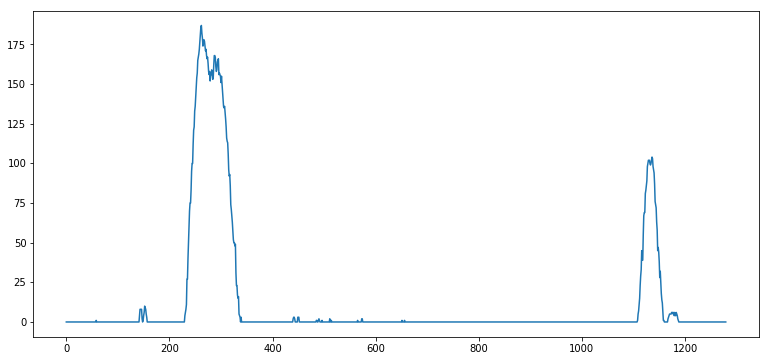

In [175]:
#Sum of y-values in each X's
y = np.sum(all_combine_binary[int(all_combine_binary.shape[0]/2):, :], axis=0)
#print('Total X_index:', y.shape)

#Draw a peak in the first half, it means the left lane
xhalf = int(y.shape[0]/2)
xleft_lane = np.argmax(y[:xhalf])

#Draw a peak in the second half, it means the right lane
xright_lane = np.argmax(y[xhalf:]) + xhalf

print('Peaks (Left, Right): ',xleft_lane, xright_lane)
plt.figure(figsize=(13, 6))
plt.plot(y);

In [178]:
nonzero

(array([  1,   1,   1, ..., 717, 717, 718]),
 array([1269, 1270, 1271, ...,  241,  247,  651]))

(720, 0)

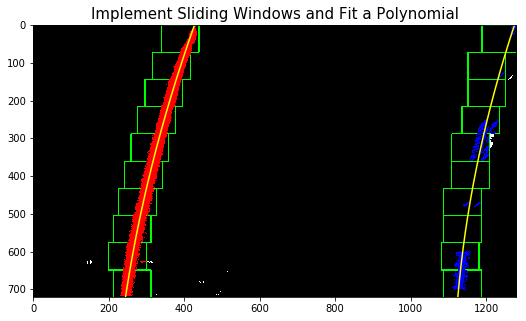

In [179]:
out_img = np.dstack((all_combine_binary, all_combine_binary, all_combine_binary))*255

# Choose the number of sliding windows
n_windows = 10

# Set height of windows, 720/n_windows(10) = 72
window_height = np.int(all_combine_binary.shape[0]/n_windows)

# Identify the x and y positions of all nonzero pixels in the image
nonzero = all_combine_binary.nonzero()
nonzero_y = nonzero[0]
nonzero_x = nonzero[1]

# Current positions, index, to be updated for each window - it is argmax x index value in left and right lane
xleft_current = xleft_lane
xright_current = xright_lane

# Set the width of the windows +/- margin
margin = 50

# Set minimum number of pixels found to recenter window
minpix = 90

# Create empty lists to receive left and right lane pixel indices, index
left_lane_idx = []
right_lane_idx = []

# Step through the windows one by one
for window in range(n_windows):
    # Identify window boundaries in x and y (and right and left), those values are all index values
    win_y1 = all_combine_binary.shape[0] - (window+1) * window_height
    win_y2 = all_combine_binary.shape[0] - window * window_height
    
    win_xleft1 = xleft_current - margin
    win_xleft2 = xleft_current + margin
    win_xright1 = xright_current - margin
    win_xright2 = xright_current + margin
    #print(win_y1, win_y2, win_xleft1, win_xleft2)
    
    # Draw the windows on the visualization image
    cv2.rectangle(out_img, (win_xleft1, win_y1), (win_xleft2, win_y2), (0, 255, 0), 2) 
    cv2.rectangle(out_img, (win_xright1, win_y1),(win_xright2, win_y2), (0, 255, 0), 2) 
    
    # Identify the nonzero pixels in x and y within the window, nonzero values are index values
    good_left_idx = ((nonzero_y >= win_y1) & 
                      (nonzero_y <= win_y2) & 
                      (nonzero_x >= win_xleft1) &  
                      (nonzero_x <= win_xleft2)).nonzero()[0]
    good_right_idx = ((nonzero_y >= win_y1) & 
                      (nonzero_y <= win_y2) & 
                      (nonzero_x >= win_xright1) &  
                      (nonzero_x < win_xright2)).nonzero()[0]
    
    # Append these indices, index, to the lists
    left_lane_idx.append(good_left_idx)
    right_lane_idx.append(good_right_idx)
    
    # If you found > minpix pixels, recenter next window on their mean position
    if len(good_left_idx) > minpix:
        xleft_current = np.int(np.mean(nonzero_x[good_left_idx]))
    if len(good_right_idx) > minpix:        
        xright_current = np.int(np.mean(nonzero_x[good_right_idx]))
    #print(left_lane_idx, right_lane_idx)
    
# Concatenate the arrays of indices
left_lane_idx = np.concatenate(left_lane_idx)
right_lane_idx = np.concatenate(right_lane_idx)

# Extract left and right line pixel positions
leftx = nonzero_x[left_lane_idx]
lefty = nonzero_y[left_lane_idx] 
rightx = nonzero_x[right_lane_idx]
righty = nonzero_y[right_lane_idx] 

# Fit a second order polynomial to each, return values are coefficients
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)
#print(left_fit, right_fit)

# Generate x and y values for plotting
ploty = np.linspace(0, all_combine_binary.shape[0]-1, all_combine_binary.shape[0])
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

out_img[nonzero_y[left_lane_idx], nonzero_x[left_lane_idx]] = [255, 0, 0]
out_img[nonzero_y[right_lane_idx], nonzero_x[right_lane_idx]] = [0, 0, 255]

plt.figure(figsize=(14, 5))
plt.imshow(out_img);
plt.title('Implement Sliding Windows and Fit a Polynomial', fontsize=15)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, all_combine_binary.shape[1])
plt.ylim(all_combine_binary.shape[0], 0)

(720, 0)

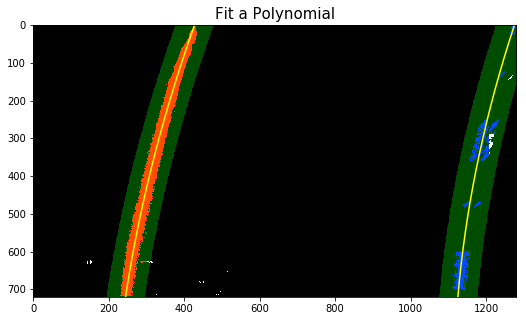

In [180]:
# Draw an image to show the selection window on the out_img
out_img_lane = np.dstack((all_combine_binary, all_combine_binary, all_combine_binary))*255
window_img = np.zeros_like(out_img_lane)

# Color in left and right line pixels
out_img_lane[nonzero_y[left_lane_idx], nonzero_x[left_lane_idx]] = [255, 0, 0]
out_img_lane[nonzero_y[right_lane_idx], nonzero_x[right_lane_idx]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx - margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx + margin, ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
#print(left_line_window1.shape, left_line_window2.shape)

right_line_window1 = np.array([np.transpose(np.vstack([right_fitx - margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx + margin, ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))
#print(right_line_window1.shape, right_line_window2.shape)

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0, 255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0, 255, 0))

result = cv2.addWeighted(out_img_lane, 1, window_img, 0.3, 0)

plt.figure(figsize=(14, 5))
plt.imshow(result);
plt.title('Fit a Polynomial', fontsize=15)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, all_combine_binary.shape[1])
plt.ylim(all_combine_binary.shape[0], 0)

In [181]:
def measure_curvature(img, x_pix):
    ym_per_pix = 30/720         # meters per pixel in y dimension
    xm_per_pix = 3.7/700        # meters per pixel in x dimension

    # Define maximum y-value corresponding to the bottom of the image, If no pixels were found return None
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0])
    y_eval = np.max(ploty)

    # Fit new polynomials to x, y in world space
    fit_cur = np.polyfit(ploty*ym_per_pix, x_pix*xm_per_pix, 2)
    curverad = ((1 + (2*fit_cur[0]*y_eval*ym_per_pix + fit_cur[1])**2)**1.5) / np.absolute(2*fit_cur[0])
    return curverad

Text(0.5,1,'Draw Poly Lane Lines in Un-Warped Image')

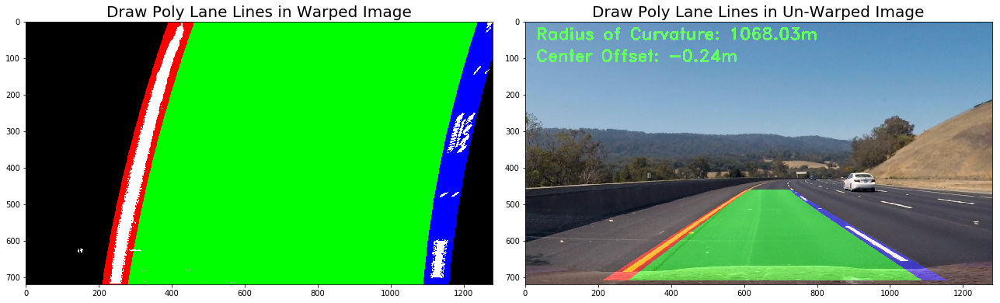

In [182]:
# Draw an image to show the selection window on the out_img, making left and right lane
out_img = np.dstack((all_combine_binary, all_combine_binary, all_combine_binary))*255
window_img = np.zeros_like(out_img)

# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
right_line_window = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
line_pts = np.hstack((left_line_window, right_line_window))
#print(left_line_window.shape, right_line_window.shape)

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([line_pts]), [0, 255, 0])

# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx - 35, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx + 35, ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))

right_line_window1 = np.array([np.transpose(np.vstack([right_fitx - 35, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx + 35, ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (255, 0, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0, 0, 255))
result_warp = cv2.addWeighted(out_img, 1, window_img, 1, 0)

# unwarped from warpperspective image
y, x = all_combine_binary.shape[:2]
unwarped = cv2.warpPerspective(window_img, M_inv, (x, y), flags=cv2.INTER_LINEAR)
result = cv2.addWeighted(mpimg.imread(images[4]), 1, unwarped, 0.5, 0)

# Calculate curvature in real world, pixel values * pixel per meter
left_curverad = measure_curvature(all_combine_binary, left_fitx)
right_curverad = measure_curvature(all_combine_binary, right_fitx)
lane_mid = (left_fitx[719] + right_fitx[719])/2

# xm_per_pix value, 3.7/700, * different pixels between x-mid(1280/2 = 640) and lane_mid  
# offset +/-: (+) is offset to the left, (-) is offset to the right
offset = (3.7/700)*(x/2 - lane_mid)

text_cur = 'Radius of Curvature: {:04.2f}'.format((left_curverad+right_curverad)/2) + 'm'
text_offset = 'Center Offset: {:04.2f}'.format(offset) + 'm'
cv2.putText(result, text_cur , (30, 50), cv2.FONT_HERSHEY_DUPLEX, 1.5, (102, 255, 102), thickness=3)
cv2.putText(result, text_offset, (30, 110), cv2.FONT_HERSHEY_DUPLEX, 1.5, (102, 255, 102), thickness=3)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))
f.tight_layout()
ax1.imshow(result_warp);
ax1.set_title('Draw Poly Lane Lines in Warped Image', fontsize=20)
ax2.imshow(result);
ax2.set_title('Draw Poly Lane Lines in Un-Warped Image', fontsize=20)

In [192]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self, mtx, dist):
        # was the line detected in the last iteration?
        self.detected = False
        self.left_fit = None
        self.right_fit = None
        self.ploty = None
        
        # use mtx and dist values from chessboard images
        # * mtx: Camera calibration matrix from chessboard images
        # * dist: Distortion Coefficients
        self.mtx = mtx
        self.dist = dist

    def fit_initial(self, all_combine_binary):
        '''
        This function makes the first poly fit lines on the left and right.
        It uses a sliding windows based on pixel peaks on left and right lane line image.
        '''
        n_windows = 10         # Number of window size
        margin = 50            # Set the width of the windows +/- margin
        minpix = 100            # Set minimum number of pixels found to recenter window

        out_img = np.dstack((all_combine_binary, all_combine_binary, all_combine_binary))*255
        
        # Set height of windows, 720/n_windows(10) = 72
        window_height = np.int(all_combine_binary.shape[0]/n_windows)

        # Identify the x and y positions of all nonzero pixels in the image
        nonzero = all_combine_binary.nonzero()
        nonzero_y = nonzero[0]
        nonzero_x = nonzero[1]

        # Sum of y-values in each X's
        y = np.sum(all_combine_binary[int(all_combine_binary.shape[0]/2):, :], axis=0)

        # A peak in the first half, it means the left lane
        # A peak in the second half, it means the right lane
        xhalf = int(y.shape[0]/2)
        xleft_lane = np.argmax(y[:xhalf])
        xright_lane = np.argmax(y[xhalf:]) + xhalf

        # Current positions, index, to be updated for each window - it is argmax x index value in left and right lane
        xleft_current = xleft_lane
        xright_current = xright_lane

        # Create empty lists to receive left and right lane pixel indices, index
        left_lane_idx = []
        right_lane_idx = []

        # Step through the windows one by one
        for window in range(n_windows):
            # Identify window boundaries in x and y (and right and left), those values are all index values
            win_y1 = all_combine_binary.shape[0] - (window+1) * window_height
            win_y2 = all_combine_binary.shape[0] - window * window_height

            win_xleft1 = xleft_current - margin
            win_xleft2 = xleft_current + margin
            win_xright1 = xright_current - margin
            win_xright2 = xright_current + margin
            #print(win_y1, win_y2, win_xleft1, win_xleft2)


            # Identify the nonzero pixels in x and y within the window, nonzero values are index values
            good_left_idx = ((nonzero_y >= win_y1) & 
                              (nonzero_y <= win_y2) & 
                              (nonzero_x >= win_xleft1) &  
                              (nonzero_x <= win_xleft2)).nonzero()[0]
            good_right_idx = ((nonzero_y >= win_y1) & 
                              (nonzero_y <= win_y2) & 
                              (nonzero_x >= win_xright1) &  
                              (nonzero_x < win_xright2)).nonzero()[0]

            # Append these indices, index, to the lists
            left_lane_idx.append(good_left_idx)
            right_lane_idx.append(good_right_idx)

            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_left_idx) > minpix:
                xleft_current = np.int(np.mean(nonzero_x[good_left_idx]))
            if len(good_right_idx) > minpix:        
                xright_current = np.int(np.mean(nonzero_x[good_right_idx]))
            #print(left_lane_idx, right_lane_idx)

        # Concatenate the arrays of indices
        left_lane_idx = np.concatenate(left_lane_idx)
        right_lane_idx = np.concatenate(right_lane_idx)

        # Extract left and right line pixel positions
        leftx = nonzero_x[left_lane_idx]
        lefty = nonzero_y[left_lane_idx] 
        rightx = nonzero_x[right_lane_idx]
        righty = nonzero_y[right_lane_idx] 

        # Fit a second order polynomial to each, return values are coefficients
        self.left_fit = np.polyfit(lefty, leftx, 2)
        self.right_fit = np.polyfit(righty, rightx, 2)
        #print(left_fit, right_fit)
        #print(left_fit.shape, right_fit.shape)

        # Generate x and y values for plotting
        self.ploty = np.linspace(0, all_combine_binary.shape[0]-1, all_combine_binary.shape[0])
        left_fitx = self.left_fit[0] * self.ploty**2 + self.left_fit[1] * self.ploty + self.left_fit[2]
        right_fitx = self.right_fit[0] * self.ploty**2 + self.right_fit[1]  *self.ploty + self.right_fit[2]
        return left_fitx, right_fitx
    
    def fit_next(self, all_combine_binary):
        '''
        This function makes poly fit lines on the left and right if there is previous coefficient values.
        It uses previous coefficient values, left_fit and right_fit, and update there values
        '''
        
        # Identify the x and y positions of all nonzero pixels in the image
        nonzero = all_combine_binary.nonzero()
        nonzero_y = nonzero[0]
        nonzero_x = nonzero[1]
        
        margin = 100                   # Set the width of the polynomials, left and right, +/- margin
        
        # Identify region of interest like window using previous poly lane fit, using previous coefficient values
        left_lane_idx = ((nonzero_x >= (self.left_fit[0]*(nonzero_y**2) + 
                                        self.left_fit[1]*nonzero_y + 
                                        self.left_fit[2] - margin)) & 
                         (nonzero_x <= (self.left_fit[0]*(nonzero_y**2) + 
                                        self.left_fit[1]*nonzero_y + 
                                        self.left_fit[2] + margin))) 

        right_lane_idx = ((nonzero_x >= (self.right_fit[0]*(nonzero_y**2) + 
                                         self.right_fit[1]*nonzero_y + 
                                         self.right_fit[2] - margin)) & 
                          (nonzero_x <= (self.right_fit[0]*(nonzero_y**2) + 
                                         self.right_fit[1]*nonzero_y + 
                                         self.right_fit[2] + margin)))  

        # Extract left and right line pixel positions
        leftx = nonzero_x[left_lane_idx]
        lefty = nonzero_y[left_lane_idx] 
        rightx = nonzero_x[right_lane_idx]
        righty = nonzero_y[right_lane_idx]

        # Fits a second order polynomial to each
        self.left_fit = np.polyfit(lefty, leftx, 2)
        self.right_fit = np.polyfit(righty, rightx, 2)

        # Generates x and y values for plotting
        left_fitx = self.left_fit[0] * self.ploty**2 + self.left_fit[1] * self.ploty + self.left_fit[2]
        right_fitx = self.right_fit[0] * self.ploty**2 + self.right_fit[1] * self.ploty + self.right_fit[2]
        return left_fitx, right_fitx

    def laneFind(self, image):
        '''
        This function is whole pipline for lane lines detection. 
        INPUT: 
            image(image format file, str)
        OUTPUT: 
            return image with Draw Poly Lane Lines in Un-Warped Image
            The image contains Radius of Curvature and Center Offset by meter
        '''
        # Getting bird eyes images (warped) from region of interest on the original image
        # There is M and M_inv: M is matrix, which makes into warped image and 
        #                       M_inv is matrix, which can turn back to original image
        _, warped, M_inv = tran_perspective(image, self.mtx, self.dist)
        img = cv2.cvtColor(warped, cv2.COLOR_BGR2HLS)[:,:,2]
        all_combine_binary = np.zeros_like(img)                          # make empty matrix

        '''
        In order to find the best thresh for each variables (Saturate, Lightness, Gradient(Sobel) 
        Horizontal and Gradient(Sobel) Vertical), I play around with ipywidgets library and get the best thresholds.

        * L-Thresh: 120 
        * S-Thresh: 100 
        * SobelX Min Thresh: 30 
        * Dir. Min Thresh: 10 degree (np.pi/18)
        '''
        # Apply binary Threshold in S-Channel and L-Channel after converted into HLS color space
        _, ls_thresh = ls_channel_thresh(warped, 120, 100)

        # Apply the gradient(sobel) Threshold on the horizontal gradient
        sobel_binary = sobelx_thresh(warped, 30, 255)

        # Apply the gradient direction Threshold to find the direction
        direction_binary = direction_thresh(warped, np.pi/18, np.pi/2)

        combine_thresh = ((sobel_binary == 1) & (direction_binary == 1))
        all_combine_binary[(ls_thresh | combine_thresh)] = 1

        # Draw an image to show the selection window on the out_img, making left and right lane
        out_img = np.dstack((all_combine_binary, all_combine_binary, all_combine_binary))*255
        window_img = np.zeros_like(out_img)

        if line.detected == False:
            left_fitx, right_fitx = line.fit_initial(all_combine_binary)
            line.detected = True
            #print('check 1')
            
        else:
            left_fitx, right_fitx = line.fit_initial(all_combine_binary)
            #print('check 2')

        # Generate a polygon to illustrate the search window area
        # And recast the x and y points into usable format for cv2.fillPoly()
        left_line_window = np.array([np.transpose(np.vstack([left_fitx, self.ploty]))])
        right_line_window = np.array([np.flipud(np.transpose(np.vstack([right_fitx, self.ploty])))])
        line_pts = np.hstack((left_line_window, right_line_window))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(window_img, np.int_([line_pts]), [0, 255, 0])

        out_margin = 20
        in_margin = 40
        # Generate a polygon to illustrate the search window area
        # And recast the x and y points into usable format for cv2.fillPoly()
        left_line_window1 = np.array([np.transpose(np.vstack([left_fitx - out_margin, self.ploty]))])
        left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx + in_margin, self.ploty])))])
        left_line_pts = np.hstack((left_line_window1, left_line_window2))

        right_line_window1 = np.array([np.transpose(np.vstack([right_fitx - in_margin, self.ploty]))])
        right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx + out_margin, self.ploty])))])
        right_line_pts = np.hstack((right_line_window1, right_line_window2))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(window_img, np.int_([left_line_pts]), (255, 0, 0))
        cv2.fillPoly(window_img, np.int_([right_line_pts]), (0, 0, 255))

        # unwarped from warpperspective image
        y, x = all_combine_binary.shape[:2]
        unwarped = cv2.warpPerspective(window_img, M_inv, (x, y), flags=cv2.INTER_LINEAR)
        result = cv2.addWeighted(image, 1, unwarped, 1, 0)

        # Calculate curvature in real world, pixel values * pixel per meter
        left_curverad = measure_curvature(all_combine_binary, left_fitx)
        right_curverad = measure_curvature(all_combine_binary, right_fitx)
        lane_mid = (left_fitx[-1] + right_fitx[-1])/2

        # xm_per_pix value, 3.7/700, * different pixels between x-mid(1280/2 = 640) and lane_mid  
        # offset +/-: (+) is offset to the left, (-) is offset to the right
        offset = (3.7/700)*(x/2 - lane_mid)

        text_cur = 'Radius of Curvature: {:04.2f}'.format((left_curverad+right_curverad)/2) + 'm'
        text_offset = 'Center Offset: {:04.2f}'.format(offset) + 'm'
        cv2.putText(result, text_cur , (50, 80), cv2.FONT_HERSHEY_DUPLEX, 1.5, (102, 255, 102), thickness=3)
        cv2.putText(result, text_offset, (50, 140), cv2.FONT_HERSHEY_DUPLEX, 1.5, (102, 255, 102), thickness=3)
        return result

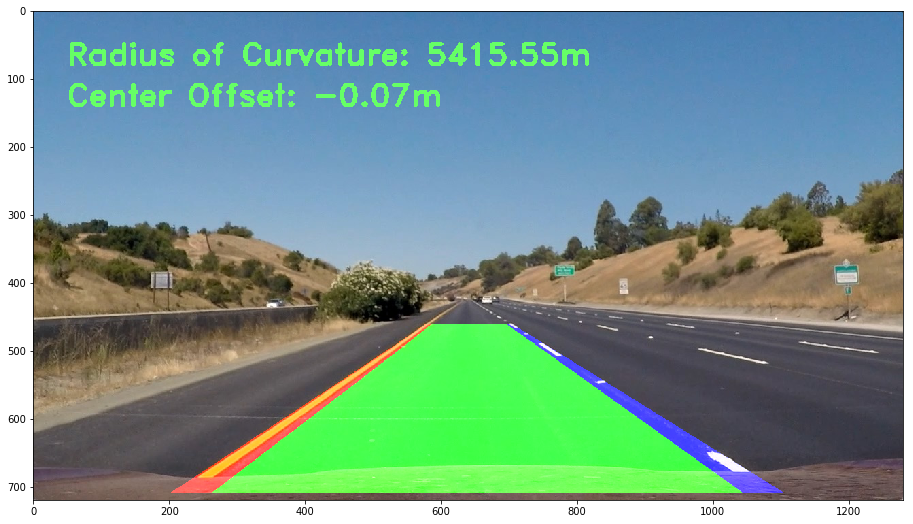

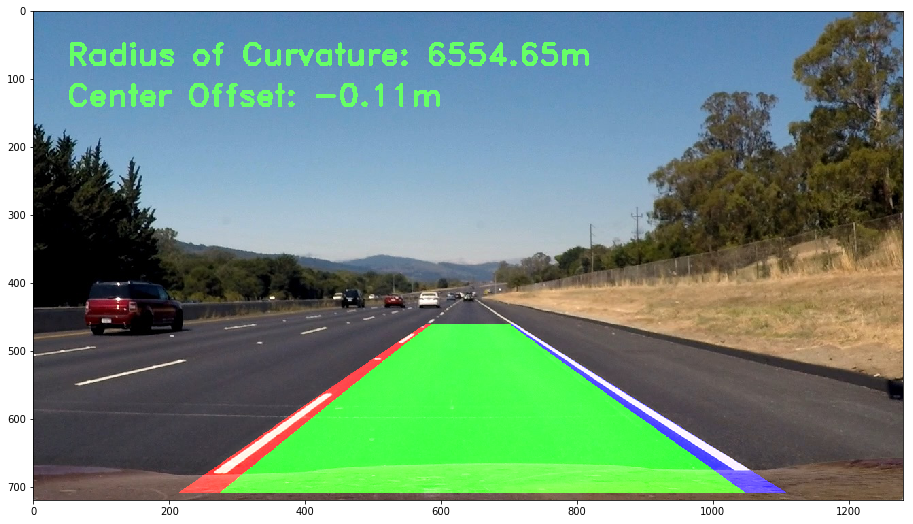

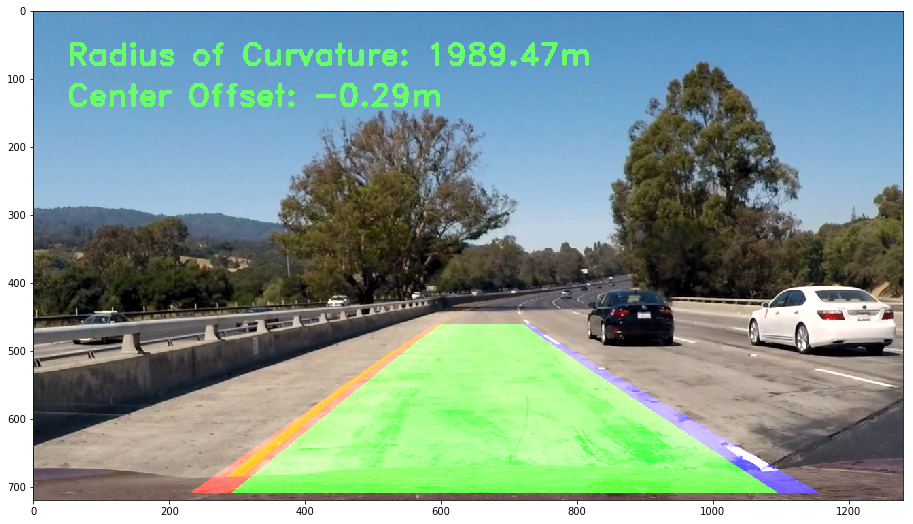

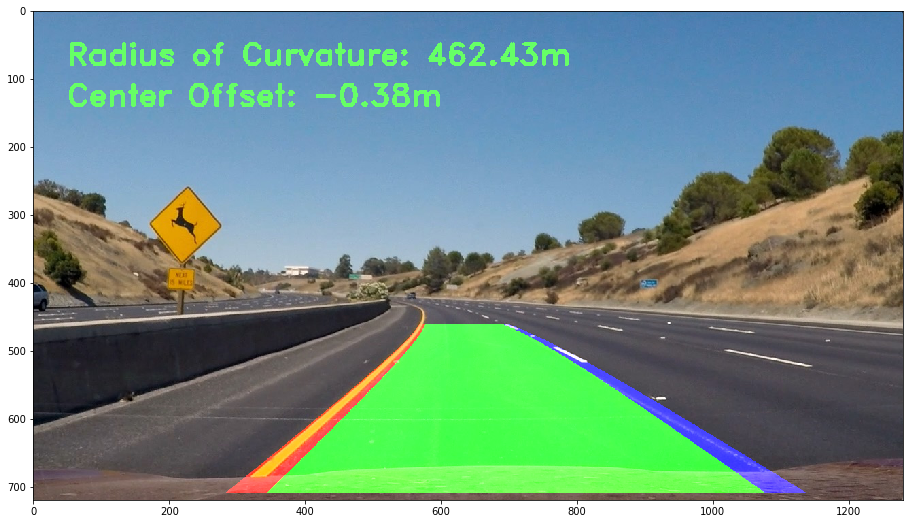

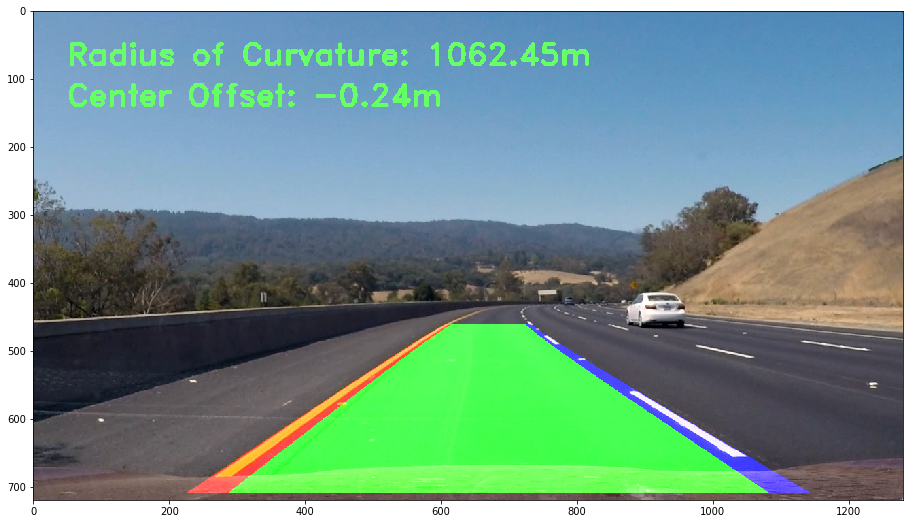

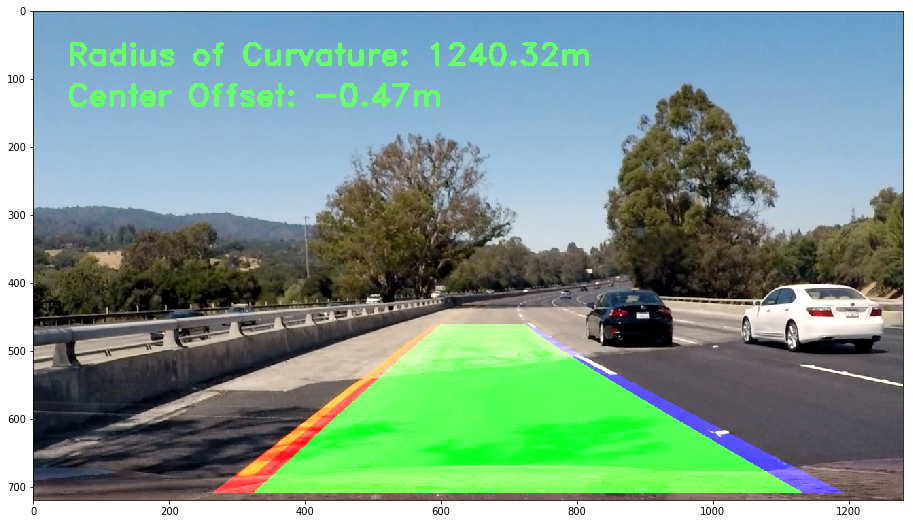

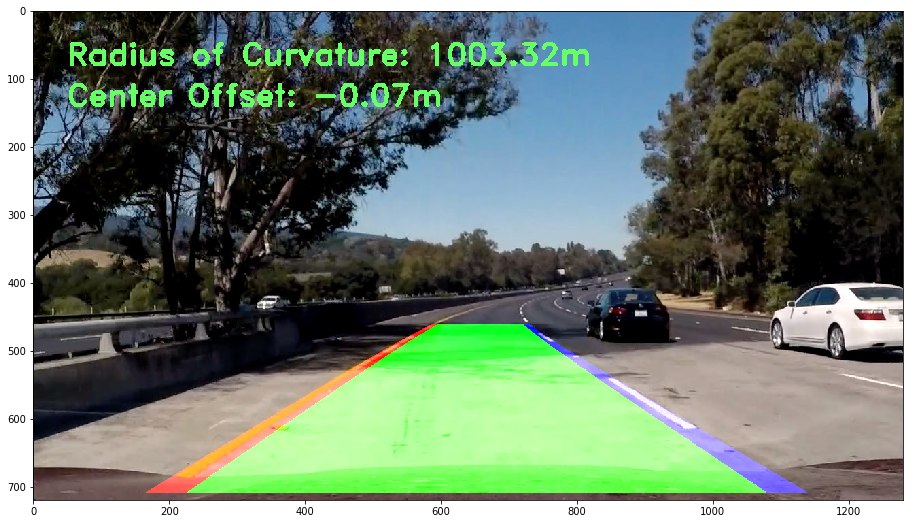

In [184]:
# Test
images = glob.glob('./test_images/*.jpg')
for i in range(0, len(images)-1, 1):
    img = mpimg.imread(images[i])
    
    # Apply pipeline laneFind
    line = Line(mtx, dist)
    prod = line.laneFind(img)
    
    plt.figure(figsize=(18,9))
    plt.imshow(prod);
plt.show()

Text(0.5,1,'Processed Image')

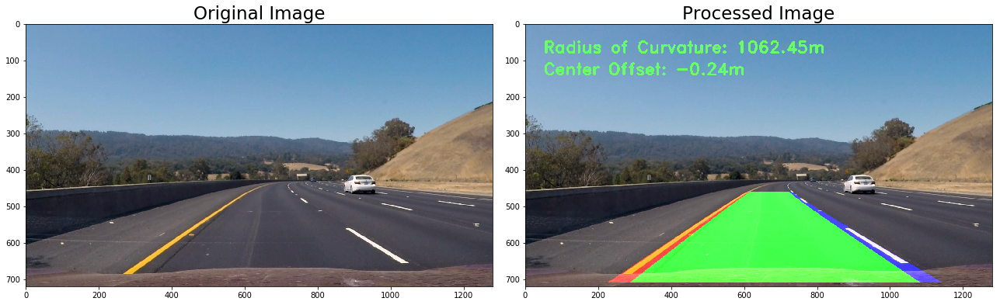

In [185]:
# Test
img = mpimg.imread('./test_images/test3.jpg')

# Apply pipeline laneFind
line = Line(mtx, dist)
prod = line.laneFind(img)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))
f.tight_layout()
ax1.imshow(img);
ax1.set_title('Original Image', fontsize=23)
ax2.imshow(prod);
ax2.set_title('Processed Image', fontsize=23)

In [262]:
from moviepy.editor import VideoFileClip

In [186]:
# Make a list of calibration images from chessboard images, and get mtx and dist
# * mtx: Camera calibration matrix from chessboard images
# * dist: Distortion Coefficients
# Make a list of calibration images
mtx, dist = calibration()

In [187]:
line = Line(mtx, dist)

output = "./output_video/project_output.mp4"
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(line.laneFind)
%time white_clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video ./output_video/project_output.mp4
[MoviePy] Writing video ./output_video/project_output.mp4


100%|█████████▉| 1260/1261 [04:15<00:00,  4.92it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./output_video/project_output.mp4 

CPU times: user 5min 16s, sys: 1min 5s, total: 6min 22s
Wall time: 4min 17s


In [191]:
line = Line(mtx, dist)

output = "./output_video/challenge_output.mp4"
clip1 = VideoFileClip("challenge_video.mp4")
white_clip = clip1.fl_image(line.laneFind)
%time white_clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video ./output_video/challenge_output.mp4
[MoviePy] Writing video ./output_video/challenge_output.mp4


100%|██████████| 485/485 [01:23<00:00,  5.84it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./output_video/challenge_output.mp4 

CPU times: user 1min 58s, sys: 18.5 s, total: 2min 17s
Wall time: 1min 24s
